In [4]:
import cv2
from PIL import Image
import numpy as np
from skimage import filters, measure, morphology, segmentation
from IPython.display import display

def sharpen_edges(image_path, show_image=False):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if show_image:
        colored_image = cv2.applyColorMap(image, cv2.COLORMAP_INFERNO)[:, :, ::-1]
        display(Image.fromarray(colored_image))

    # Apply a Gaussian filter to the image to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), 1)
    # Calculate the edge map using the Laplacian of Gaussian (LoG) method
    edge_map = filters.laplace(blurred)
    print(edge_map)
    # Convert the edge map to an 8-bit unsigned integer format
    edge_map_uint8 = np.uint8(np.round(edge_map))

    # Threshold the edge map to obtain a binary image
    _, binary_edges = cv2.threshold(edge_map_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Perform morphological operations to clean up the binary image
    footprint = morphology.disk(3)
    cleaned_edges = morphology.closing(binary_edges, footprint=footprint)
    cleaned_edges = morphology.opening(cleaned_edges, footprint=footprint)

    # Create a mask using the cleaned-up edge map
    mask = np.zeros_like(image)
    mask[cleaned_edges == 255] = 255
    

    # Apply the mask to the original image
    sharpened_image = image.copy()
    sharpened_image[mask == 0] = blurred[mask == 0]

    if show_image:
        display(cleaned_edges[cleaned_edges != 0])
        display(Image.fromarray(edge_map_uint8))
        display(Image.fromarray(cleaned_edges-image))
        colored_image = cv2.applyColorMap(sharpened_image, cv2.COLORMAP_INFERNO)[:, :, ::-1]
        display(Image.fromarray(colored_image))
    return sharpened_image

# Example usage:
# image_path = "Results/model_depth_anything/D1/predicted_depth/T_S03116.png"
# sharpened_image = sharpen_edges(image_path=image_path, show_image=True)

In [2]:
import cv2
from PIL import Image
import numpy as np
from IPython.display import display

def display_colored(image):
    colored_image = cv2.applyColorMap(image, cv2.COLORMAP_INFERNO)[:, :, ::-1]
    display(Image.fromarray(colored_image))

def sharpen_edges(image_path, show_image=False):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if show_image:
        colored_image = cv2.applyColorMap(image, cv2.COLORMAP_INFERNO)[:, :, ::-1]
        display(Image.fromarray(colored_image))

    # Apply a Gaussian filter to the image to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Detect edges using the Canny edge detector
    edges = cv2.Canny(image, 30, 40)

    # Create a mask using the cleaned-up edge map
    mask = np.zeros_like(image)
    mask[edges != 0] = 255

    # Apply the mask to the original image
    sharpened_image = image.copy()
    # Create a sharpening kernel
    kernel = np.array([[-1,-1,-1],
                    [-1,9,-1],
                    [-1,-1,-1]])

    # Apply the sharpening kernel to the image
    sharpened_image = cv2.filter2D(sharpened_image, -1, kernel)
    
    blurred[mask!=0] = sharpened_image[mask!=0]
    sharpened_image = blurred

    if show_image:
        display(Image.fromarray(mask))
        colored_image = cv2.applyColorMap(sharpened_image, cv2.COLORMAP_INFERNO)[:, :, ::-1]
        display(Image.fromarray(colored_image))

    return sharpened_image

# Example usage:
image_path = "Results/model_depth_anything/D1/predicted_depth/T_S03116.png"
sharpened_image_canny = sharpen_edges(image_path=image_path, show_image=True)

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\colormap.cpp:738: error: (-2:Unspecified error) in function 'void __cdecl cv::colormap::ColorMap::operator ()(const class cv::_InputArray &,const class cv::_OutputArray &) const'
> Not supported (expected: 'src.dims == 2'), where
>     'src.dims' is 0
> must be equal to
>     '2' is 2


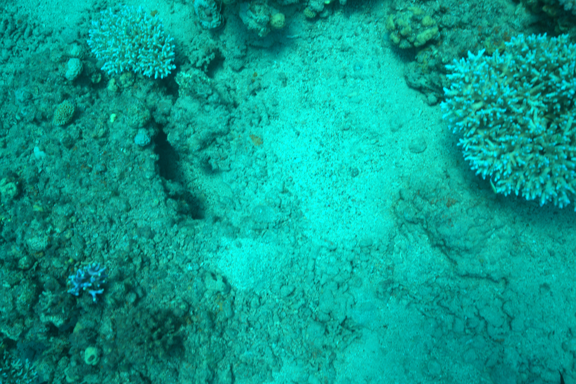

(384, 576, 3)


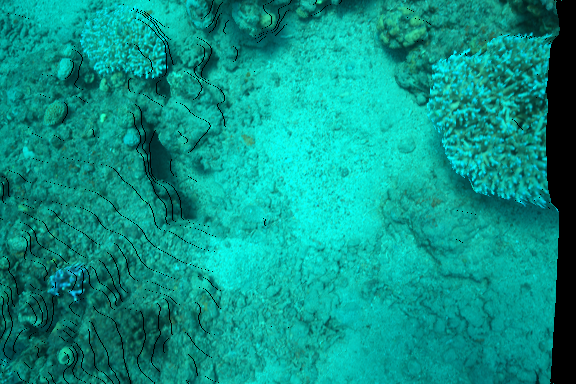

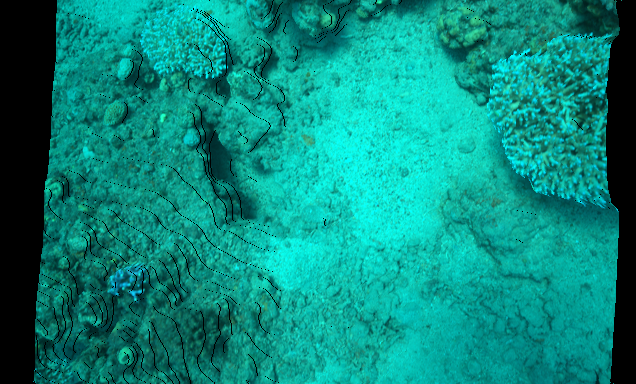

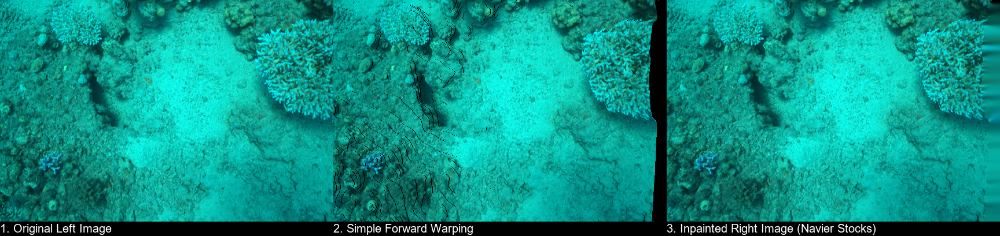

In [5]:
import cv2
import numpy as np
from PIL import Image
import rawpy
import torch
import torch.nn.functional as F
import tifffile as tiff
import Pude_training_loop.pude_utils as pude_utils

def warp_stereo_image_1(stereo_image, disparity, scalingfactor=20):
    """
    Warps the left image to the right image based on the disparity map.
    :param stereo_image: A numpy array of shape (height, width, 3) representing the stereo image.
    :param disparity: A numpy array of shape (height, width) representing the disparity map.
    :return: A numpy array of shape (height, width, 3) representing the warped image.
    """
    height, width = disparity.shape
    warped_image = np.zeros_like(stereo_image)

    for y in range(height):
        for x in range(width):
            # Compute the new x-coordinate based on the disparity map
            new_x = x - int(disparity[y, x]/scalingfactor)
            # new_x = int(((new_x/(width-1))-0.5)*2)
            if new_x >= 0 and new_x < width:
                # Copy the pixel from the left image to the warped image
                warped_image[y, new_x] = stereo_image[y, x]

    return warped_image

def warp_stereo_image(stereo_image, disparity, scalingfactor=20):
    """
    Warps the left image to the right image based on the disparity map.
    :param stereo_image: A numpy array of shape (height, width, 3) representing the stereo image.
    :param disparity: A numpy array of shape (height, width) representing the disparity map.
    :return: A numpy array of shape (height, width, 3) representing the warped image.
    """
    height, width = disparity.shape
    max_disparity = np.max(disparity)
    max_shift = int(max_disparity/scalingfactor)
    new_width = width + 2*max_shift
    warped_image = np.zeros((height, new_width, 3), dtype=np.uint8)

    for y in range(height):
        for x in range(width):
            # Compute the new x-coordinate based on the disparity map
            new_x = x - int(disparity[y, x]/scalingfactor) + 2*max_shift
            # Copy the pixel from the left image to the warped image
            warped_image[y, new_x] = stereo_image[y, x]

    # Crop the warped image to remove empty bits on the edges
    # warped_image = warped_image[:, max_shift:max_shift+width]

    return warped_image


def warp_stereo_image_2(stereo_image, depth, scalingfactor=20):
    """
    Warps the left image to the right image based on the disparity map.
    :param stereo_image: A numpy array of shape (height, width, 3) representing the stereo image.
    :param disparity: A numpy array of shape (height, width) representing the disparity map.
    :return: A numpy array of shape (height, width, 3) representing the warped image.
    """
    height, width = depth.shape
    max_disparity = np.max(disparity)
    max_shift = int(max_disparity/scalingfactor)
    new_width = width + 2*max_shift
    warped_image = np.zeros((height, new_width, 3), dtype=np.uint8)

    for y in range(height):
        for x in range(width):
            # Compute the new x-coordinate based on the disparity map
            new_x = x - int(disparity[y, x]/scalingfactor) + max_shift
            # Copy the pixel from the left image to the warped image
            warped_image[y, new_x] = stereo_image[y, x]

    # Crop the warped image to remove empty bits on the edges
    # warped_image = warped_image[:, max_shift:max_shift+width]

    return warped_image


image_path = "Datasets/SeaThru_old/D1/Raw/T_S03116.ARW"
depth_path = "Datasets/SeaThru_old/D1/Depth/depthT_S03116.TIF"
disparity_path = "Results/SeaThru_old/depth_anything/D1/predicted_depth/T_S03116.png"
disparity = cv2.imread(disparity_path, cv2.IMREAD_GRAYSCALE)
# print(disparity.shape)
image_dim = (576,384)
depth = tiff.imread(depth_path)
with rawpy.imread(image_path) as raw_image:
    rgb = raw_image.postprocess()
    image = Image.fromarray(rgb)
    # print(f"Original image size: {w}x{h}")
    # print(f"Resized image size: {width}x{height}")
    image = image.resize(image_dim)
    image = np.array(image)
    display(Image.fromarray(image))
    print(image.shape)

warped_image_1 = warp_stereo_image_1(image, disparity, scalingfactor=8)
mask = np.all(warped_image_1 == [0, 0, 0], axis=-1).astype(np.uint8)

# Inpaint damaged region using Exemplar-based inpainting
inpainted_img = cv2.inpaint(warped_image_1, mask, inpaintRadius=4, flags=cv2.INPAINT_NS)
display(Image.fromarray(warped_image_1))
warped_image = warp_stereo_image(image, disparity, scalingfactor=8)
display(Image.fromarray(warped_image))


pude_utils.make_image_grid_title([Image.fromarray(image), 
                                  Image.fromarray(warped_image_1), 
                                  Image.fromarray(inpainted_img)],
                                    ["1. Original Left Image", "2. Simple Forward Warping", "3. Inpainted Right Image (Navier Stocks)"], 1, 3, font_size=20)

# warped_image = warp_stereo_image(image, sharpened_image)
# display(Image.fromarray(warped_image))


# warped_image = warp_stereo_image(image, sharpened_image_canny)
# display(Image.fromarray(warped_image))

# warped_image = warp_stereo_image(image, sharpened_image_canny, scalingfactor=1)
# display(Image.fromarray(warped_image))


contours


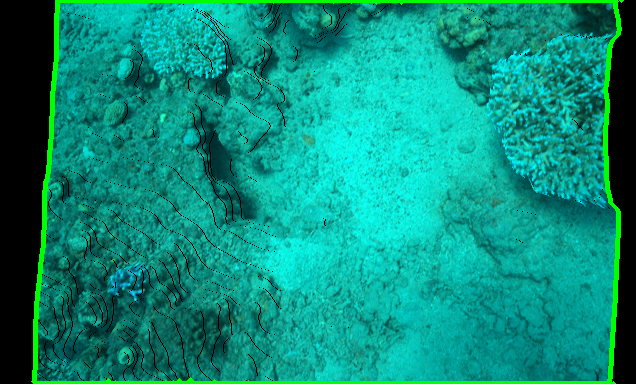

cropped to the largest contour


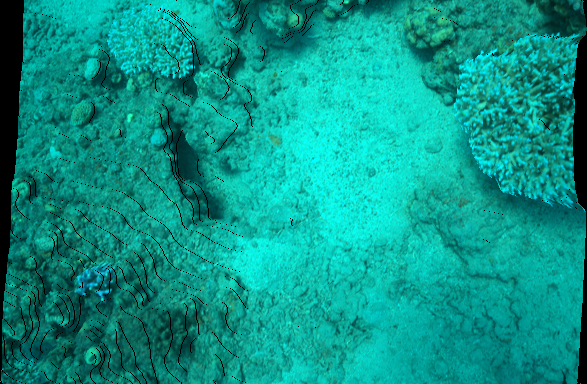

cropped to the center to original dimensions


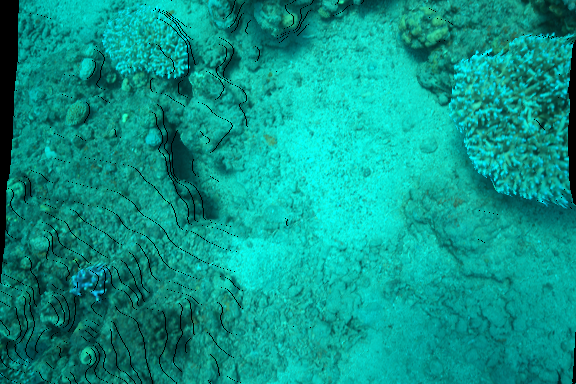

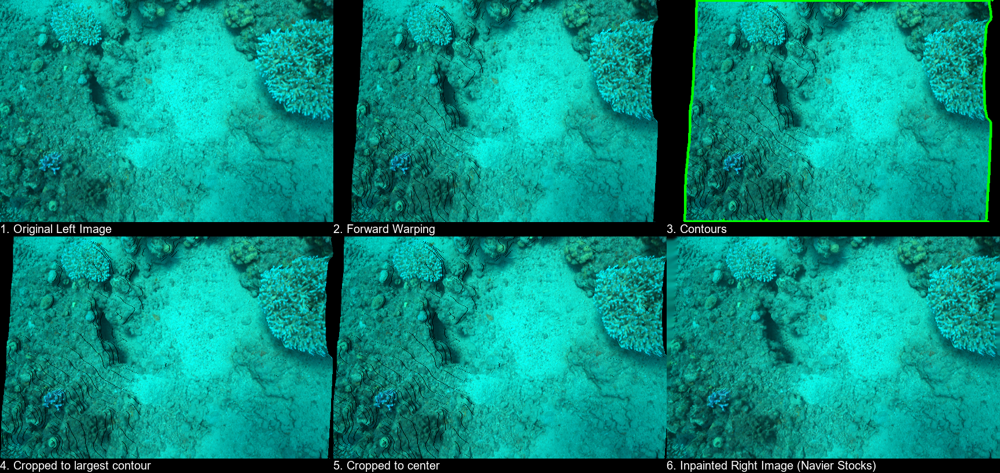

In [4]:
def crop_image(image, org_img,  image_dim=image_dim):
    
    def crop_center(image, target_height, target_width):
        # Get the dimensions of the original image
        image_height, image_width = image.shape[:2]

        # Calculate the starting point for the crop
        start_x = max(0, (image_width - target_width) // 2)
        start_y = max(0, (image_height - target_height) // 2)

        # Calculate the end point for the crop
        end_x = min(image_width, start_x + target_width)
        end_y = min(image_height, start_y + target_height)

        # Perform the crop
        cropped_image = image[start_y:end_y, start_x:end_x]

        return cropped_image
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Find contours of non-black regions
    contours, _ = cv2.findContours(gray_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # display the contours
    
    contours_image = cv2.drawContours(image.copy(), contours, -1, (0, 255, 0), 3)
    contours_image1 = contours_image.copy()
    print("contours")
    display(Image.fromarray(contours_image))
    # Get bounding box of the largest contour
     
    # Sort contours by area in descending order
    contours = sorted(contours, key=cv2.contourArea, reverse=True)

    x, y, w, h = cv2.boundingRect(contours[0])
    # Crop the image using the bounding box
    cropped_image0 = image[y:y+h, x:x+w]

    print("cropped to the largest contour")
    display(Image.fromarray(cropped_image0))
    cropped_image = crop_center(cropped_image0, image_dim[1], image_dim[0])
    print("cropped to the center to original dimensions")
    display(Image.fromarray(cropped_image))

    mask = np.all(cropped_image == [0, 0, 0], axis=-1).astype(np.uint8)

    # Inpaint damaged region using Exemplar-based inpainting
    inpainted_img = cv2.inpaint(cropped_image, mask, inpaintRadius=4, flags=cv2.INPAINT_NS)

    # Display all images in a grid
    grid_image = pude_utils.make_image_grid_title([Image.fromarray(org_img),
                                                   Image.fromarray(image),
                                                   Image.fromarray(contours_image1),
                                                   Image.fromarray(cropped_image0),
                                                    Image.fromarray(cropped_image),
                                                    Image.fromarray(inpainted_img)],
                                                    ["1. Original Left Image","2. Forward Warping", "3. Contours", 
                                                     "4. Cropped to largest contour", "5. Cropped to center", "6. Inpainted Right Image (Navier Stocks)"], 
                                                    2, 3, font_size=20)
    display(grid_image)

                                                   
    return cropped_image

cropped_image = crop_image(warped_image, image)

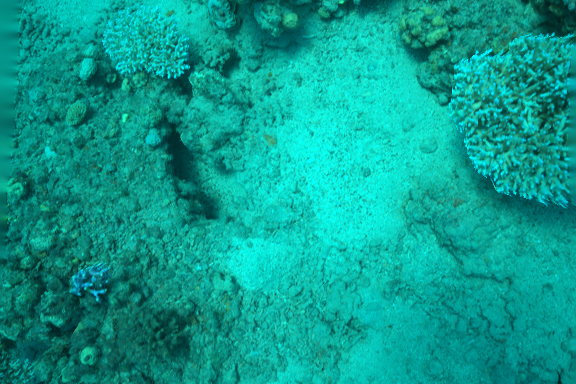

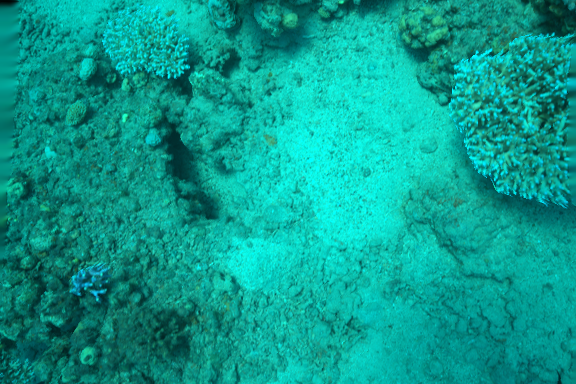

In [206]:
# Create a mask where black pixels are set to 1
mask = np.all(cropped_image == [0, 0, 0], axis=-1).astype(np.uint8)

# Inpaint damaged region using Exemplar-based inpainting
inpainted_img = cv2.inpaint(cropped_image, mask, inpaintRadius=4, flags=cv2.INPAINT_TELEA)
inpainted_img_2 = cv2.inpaint(cropped_image, mask, inpaintRadius=4, flags=cv2.INPAINT_NS)
# Display inpainted image
display(Image.fromarray(inpainted_img))
display(Image.fromarray(inpainted_img_2))

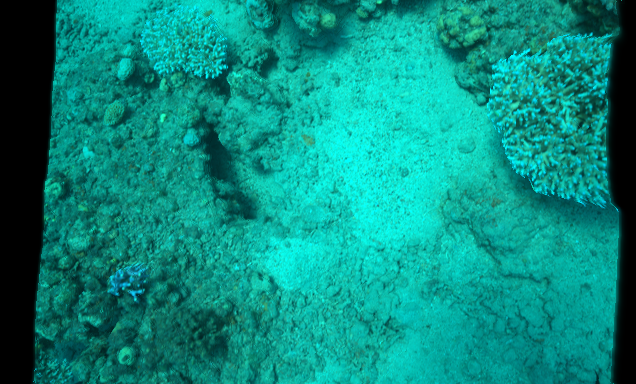

In [207]:
# fill black pixels with the average of the surrounding pixels
def fill_black_pixels(image, count=1, kernel_half_size=3):
    """
    Fills black pixels in the image with the average of the surrounding pixels.
    :param image: A numpy array of shape (height, width, 3) representing the image.
    :return: A numpy array of shape (height, width, 3) representing the image with black pixels filled in.
    """
    # Create a copy of the image
    filled_image = image.copy()
    for i in range(count):
        # Iterate over each pixel in the image
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                # If the pixel is black, fill it in with the average of the surrounding pixels
                if np.all(filled_image[y, x] == 0):
                    # Calculate the average of the surrounding pixels
                    surrounding_pixels = []
                    for dy in range(-kernel_half_size, kernel_half_size):
                        for dx in range(-kernel_half_size, kernel_half_size):
                            if y + dy >= 0 and y + dy < image.shape[0] and x + dx >= 0 and x + dx < image.shape[1]:
                                surrounding_pixels.append(filled_image[y + dy, x + dx])
                    surrounding_pixels = np.array(surrounding_pixels)
                    average_pixel = np.mean(surrounding_pixels, axis=0)

                    # Fill in the black pixel with the average of the surrounding pixels
                    filled_image[y, x] = average_pixel

    return filled_image

filled_image = fill_black_pixels(warped_image, kernel_half_size=3, count=1)
display(Image.fromarray(filled_image))

contours


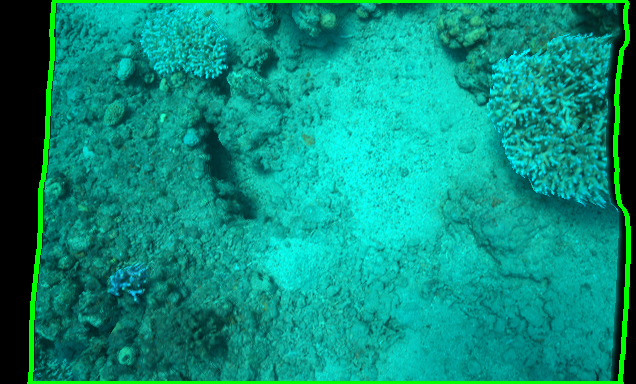

cropped to the largest contour


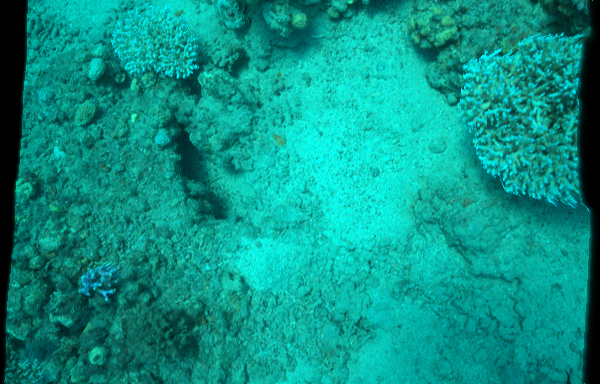

cropped to the center to original dimensions


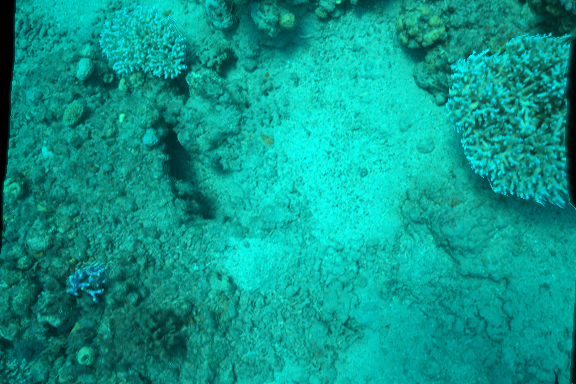

In [208]:
cropped_image_filled = crop_image(filled_image)

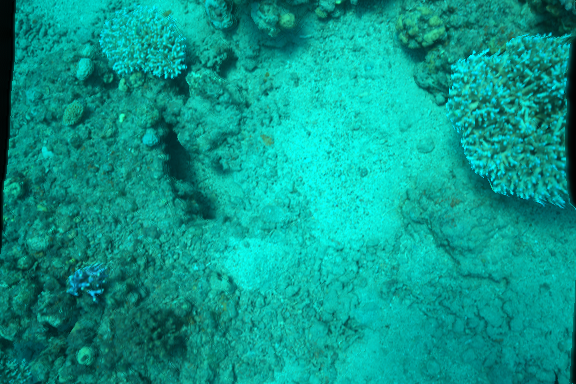

In [209]:
# Create a mask where black pixels are set to 1
mask = np.all(cropped_image_filled == [0, 0, 0], axis=-1).astype(np.uint8)

# Inpaint damaged region using Exemplar-based inpainting
inpainted_img = cv2.inpaint(cropped_image_filled, mask, inpaintRadius=4, flags=cv2.INPAINT_TELEA)

# Display inpainted image
display(Image.fromarray(inpainted_img))

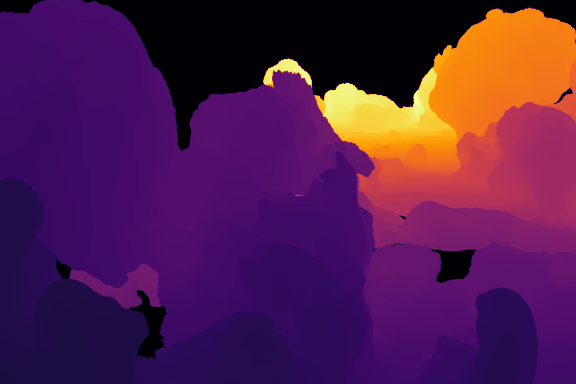

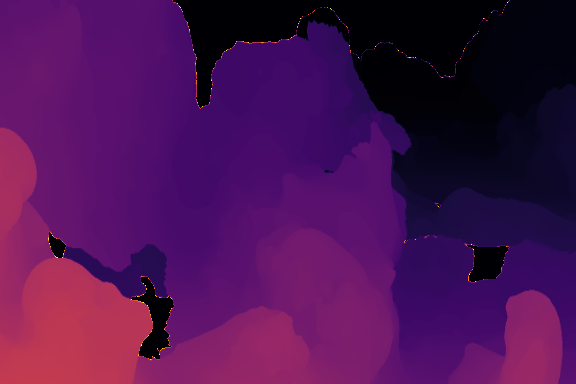

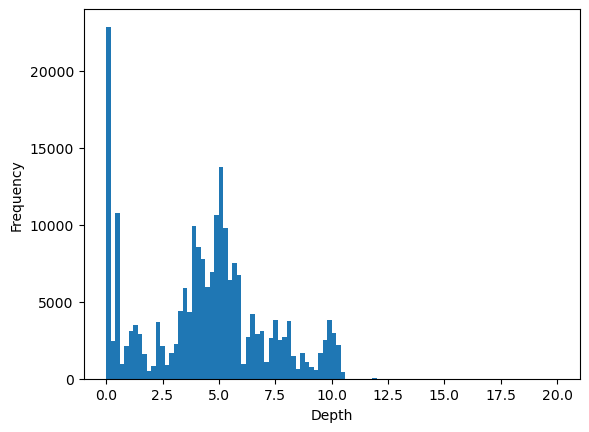

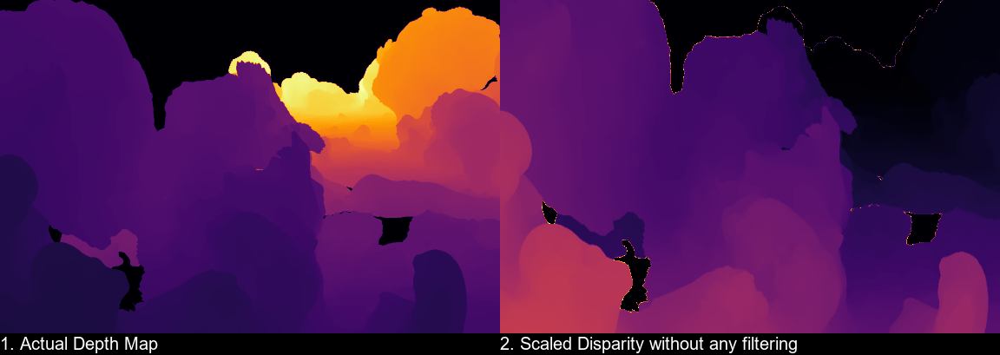

In [17]:

import Pude_training_loop.pude_utils as pude_utils
import monocular_stereo_matching.stereo_dataset_loader as data_loader
import cv2
import monocular_stereo_matching.stereo_eval as stereo_eval
from skimage.transform import resize
import matplotlib.pyplot as plt
dataset_name = "rock_garden1"
dataset_names = [dataset_name]
save_ground_truth = False

dataset_loader = data_loader.DatasetLoader(total_num_pairs=100, dataset_names=dataset_names) # Initialize dataset loader with default parameters

left_image, right_image, ground_truth, valid_indices = dataset_loader[0]

# display the ground truth
actual_depth1 = dataset_loader._open_stereo_image_pair(dataset_loader.image_pairs[0], dataset_loader.img_dim)[2]
actual_depth = resize(actual_depth1, (dataset_loader.img_dim[1], dataset_loader.img_dim[0]), anti_aliasing=True).flatten()
display(pude_utils.get_depth_as_image(actual_depth))
display(pude_utils.get_depth_as_image(ground_truth))

# plot the ground truth as histogram
plt.hist(ground_truth, bins=100, range=(0, 20))
plt.xlabel('Depth')
plt.ylabel('Frequency')
plt.show()


# display actual depth and ground truth in a grid
display(pude_utils.make_image_grid_title([pude_utils.get_depth_as_image(actual_depth), pude_utils.get_depth_as_image(ground_truth)],
                                            ["1. Actual Depth Map", "2. Scaled Disparity without any filtering"], 1, 2, font_size=20))

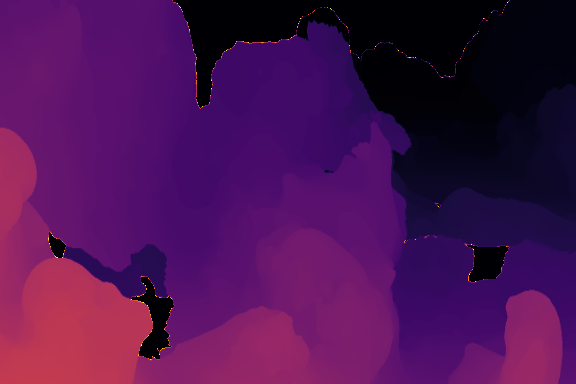

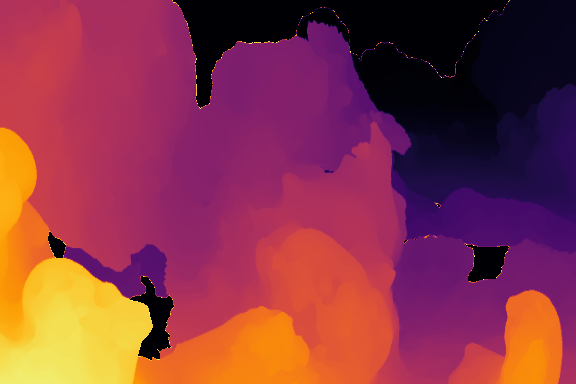

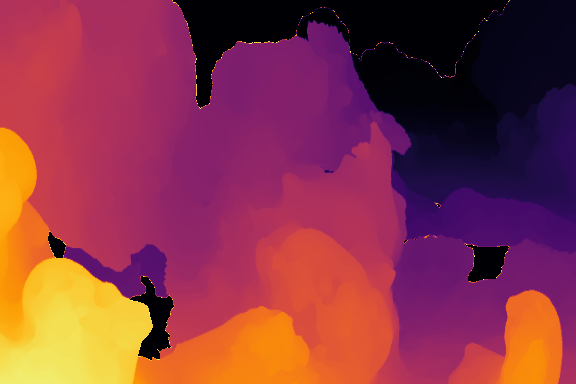

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def find_and_plot_outliers(ground_truth, bins=100, range=(0, 20), z_threshold=3, show_plots=False):
    """
    Function to plot histogram of ground truth data and identify outliers using IQR and Z-score methods.
    
    Parameters:
    - ground_truth: array-like, the ground truth data
    - bins: int, number of bins for the histogram
    - range: tuple, range of values for the histogram
    - z_threshold: float, Z-score threshold to identify outliers
    
    Returns:
    - iqr_outliers: list, outliers identified using the IQR method
    - z_outliers: list, outliers identified using the Z-score method
    - modified_ground_truth: np.array, ground truth data with outliers set to 0
    """
    if show_plots:
        g_min = np.min(ground_truth)
        g_max = np.max(ground_truth)
        g_range = (g_min, g_max)
        # Plot the histogram
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.show()

    # IQR Method
    Q1 = np.percentile(ground_truth, 25)
    Q3 = np.percentile(ground_truth, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    iqr_outliers = [x for x in ground_truth if x < lower_bound or x > upper_bound]
    
    # Z-score Method
    z_scores = stats.zscore(ground_truth)
    z_outliers = ground_truth[np.abs(z_scores) > z_threshold]
    
    if show_plots:
        # Plot the histogram with IQR outliers
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.hist(iqr_outliers, bins=bins, range=g_range, alpha=0.5, color='r', label='IQR Outliers', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram with IQR Outliers')
        plt.show()

        # Plot the histogram with Z-score outliers
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.hist(z_outliers, bins=bins, range=g_range, alpha=0.5, color='g', label='Z-score Outliers', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram with Z-score Outliers')
        plt.show()
        
        print(f"Number of IQR outliers: {len(iqr_outliers)}")
        print(f"Number of Z-score outliers: {len(z_outliers)}")
    
    # Set outliers to 0 in ground truth data
    combined_outliers = set(iqr_outliers).union(set(z_outliers))
    modified_ground_truth = np.array([0 if (x in combined_outliers) else x for x in ground_truth])
    
    # rescale the modified ground truth
    modified_ground_truth = (modified_ground_truth - np.min(modified_ground_truth)) / (np.max(modified_ground_truth) - np.min(modified_ground_truth))
    modified_ground_truth = modified_ground_truth * (range[1] - range[0]) + range[0]

    if show_plots:
        # Plot the histogram with outliers set to 0
        plt.hist(modified_ground_truth, bins=bins, range=range, alpha=0.5, label='Modified Ground Truth', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram after Removing Outliers')
        plt.show()
        
    return iqr_outliers, z_outliers, modified_ground_truth

display(pude_utils.get_depth_as_image(ground_truth))
iqr_outliers, z_outliers, clean_ground_truth = find_and_plot_outliers(ground_truth)

# Display the cleaned ground truth
display(pude_utils.get_depth_as_image(clean_ground_truth))

iqr_outliers, z_outliers, clean_ground_truth = find_and_plot_outliers(clean_ground_truth)

# Display the cleaned ground truth
display(pude_utils.get_depth_as_image(clean_ground_truth))



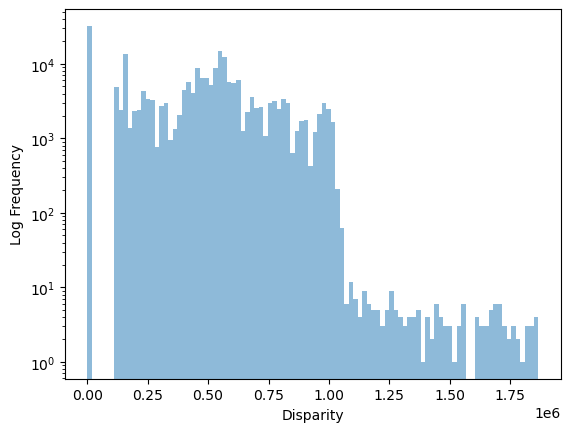

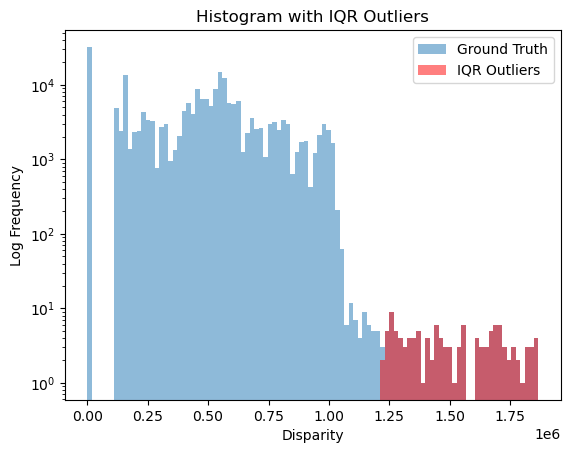

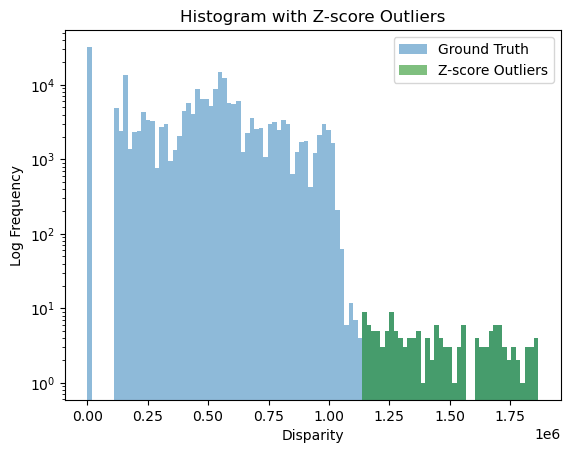

Number of IQR outliers: 122
Number of Z-score outliers: 148


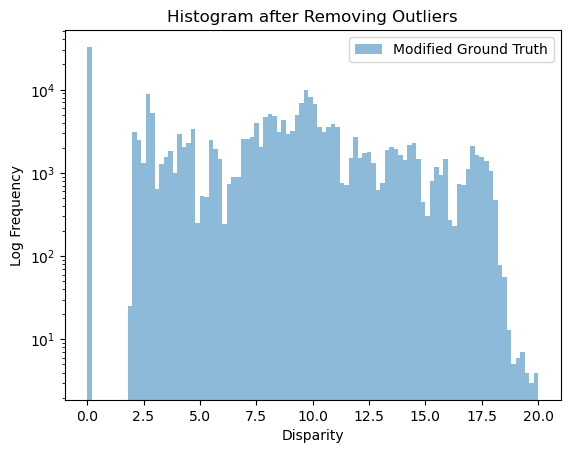

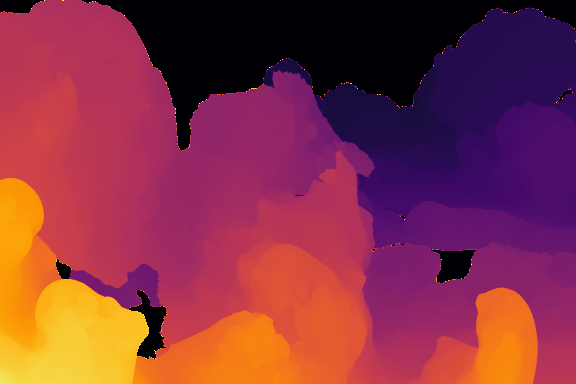

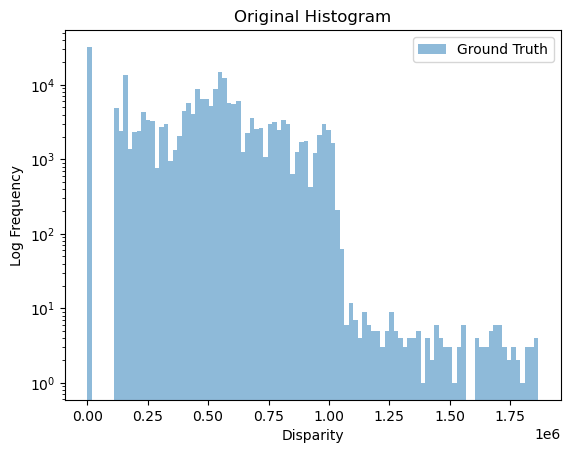

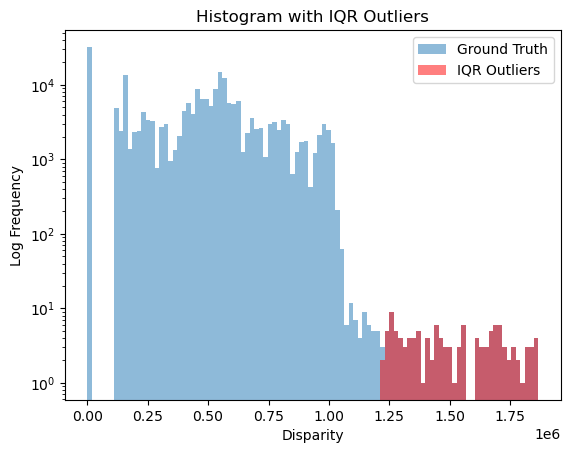

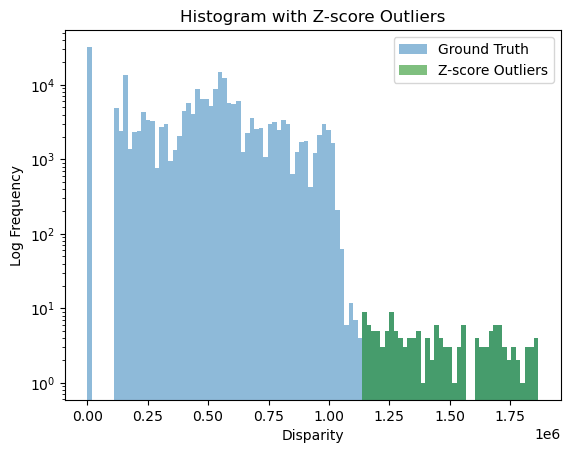

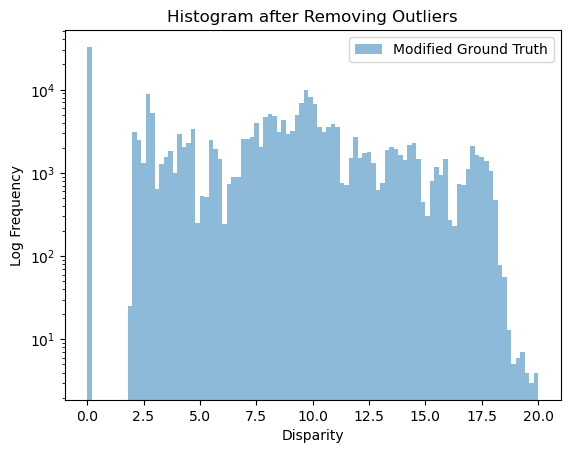

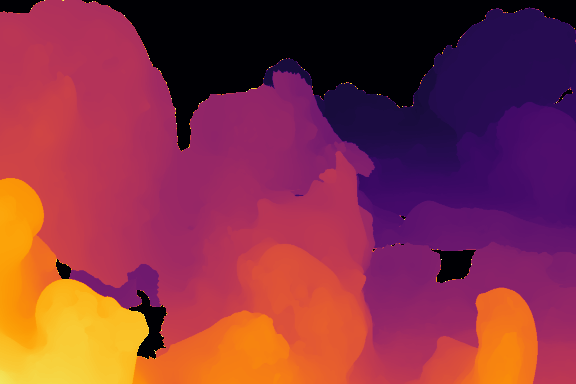

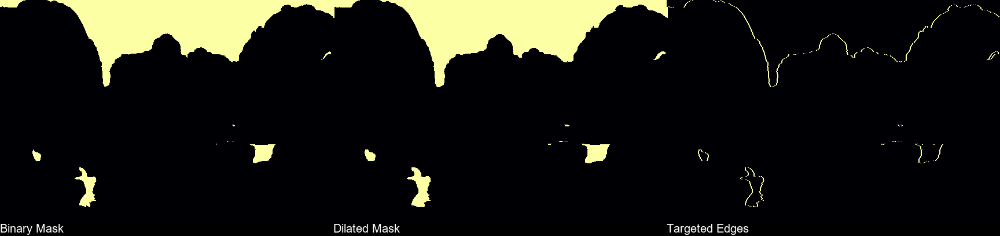

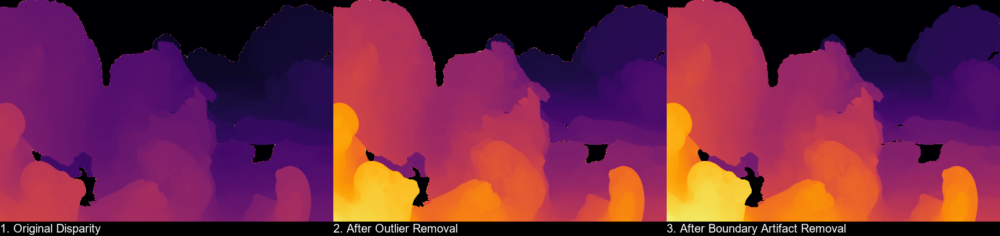

In [30]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


def find_and_plot_outliers2(ground_truth: np.ndarray, bins: int = 100, range = (0, 20), z_threshold: float = 3.0, show_plots: bool = False):
    """
    Identify and plot outliers in the ground truth data using IQR and Z-score methods.

    Parameters:
        ground_truth (np.ndarray): Ground truth data.
        bins (int): Number of bins for the histogram.
        range (Tuple[int, int]): Range of the histogram.
        z_threshold (float): Z-score threshold for outlier detection.
        show_plots (bool): Whether to display plots.
    
    Returns:
        Tuple[List[float], List[float], np.ndarray]: Tuple containing the IQR outliers, Z-score outliers, and modified ground truth data.
    """
    
    # Calculate the Interquartile Range (IQR)
    Q1 = np.percentile(ground_truth, 25)
    Q3 = np.percentile(ground_truth, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify IQR outliers
    iqr_mask = (ground_truth < lower_bound) | (ground_truth > upper_bound)
    iqr_outliers = ground_truth[iqr_mask]
    
    # Calculate Z-scores and identify Z-score outliers
    z_scores = stats.zscore(ground_truth)
    z_mask = np.abs(z_scores) > z_threshold
    z_outliers = ground_truth[z_mask]
    
    if show_plots:
        g_min, g_max = np.min(ground_truth), np.max(ground_truth)
        g_range = (g_min, g_max)
        
        # Plot the original histogram
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.title('Original Histogram')
        plt.legend()
        plt.show()
        
        # Plot the histogram with IQR outliers
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.hist(iqr_outliers, bins=bins, range=g_range, alpha=0.5, color='r', label='IQR Outliers', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram with IQR Outliers')
        plt.show()
        
        # Plot the histogram with Z-score outliers
        plt.hist(ground_truth, bins=bins, range=g_range, alpha=0.5, label='Ground Truth', log=True)
        plt.hist(z_outliers, bins=bins, range=g_range, alpha=0.5, color='g', label='Z-score Outliers', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram with Z-score Outliers')
        plt.show()
    
    # Combine outliers from both methods
    combined_mask = iqr_mask | z_mask
    
    # Create modified ground truth by setting outliers to zero
    modified_ground_truth = np.copy(ground_truth)
    modified_ground_truth[combined_mask] = 0
    
    # Rescale the modified ground truth
    min_val = np.min(modified_ground_truth)
    max_val = np.max(modified_ground_truth)
    if max_val > min_val:
        modified_ground_truth = (modified_ground_truth - min_val) / (max_val - min_val)
        modified_ground_truth = modified_ground_truth * (range[1] - range[0]) + range[0]
    else:
        modified_ground_truth.fill((range[1] + range[0]) / 2)
    
    if show_plots:
        # Plot the histogram with outliers set to 0
        plt.hist(modified_ground_truth, bins=bins, range=range, alpha=0.5, label='Modified Ground Truth', log=True)
        plt.xlabel('Disparity')
        plt.ylabel('Log Frequency')
        plt.legend()
        plt.title('Histogram after Removing Outliers')
        plt.show()
    
    return iqr_outliers.tolist(), z_outliers.tolist(), modified_ground_truth

def depth_to_disparity(depth_map, intrinsic_matrix, translation_vector):
        # Extract intrinsic parameters
        fx = intrinsic_matrix[0, 0]
        baseline = np.linalg.norm(translation_vector)
        # Initialize disparity map
        disparity_map = np.zeros_like(depth_map, dtype=np.float32)
        # Calculate disparity using valid depth values
        valid_indices = (depth_map > 0.4) & (depth_map < 12)
        disparity_map[valid_indices] = fx * baseline / depth_map[valid_indices]
        # scale the disparity map to 0-20
        # disparity_map[valid_indices] = (disparity_map[valid_indices] - np.min(disparity_map[valid_indices])) / (np.max(disparity_map[valid_indices]) - np.min(disparity_map[valid_indices])) * 20

        return disparity_map, valid_indices



disparity = depth_to_disparity(actual_depth, 
                               dataset_loader.stereo_params['CameraParameters1']['IntrinsicMatrix'],
                                 dataset_loader.stereo_params['ExtrinsicParameters']['TranslationOfCamera2'])[0]
# remove the outliers
iqr_outliers, z_outliers, clean_disparity = find_and_plot_outliers(disparity.copy(), show_plots=True, z_threshold=2.5)
display(pude_utils.get_depth_as_image(clean_disparity))

# remove the outliers
iqr_outliers, z_outliers, clean_disparity = find_and_plot_outliers2(disparity.copy(), show_plots=True, z_threshold=2.5)
display(pude_utils.get_depth_as_image(clean_disparity))


from skimage import filters, morphology
def process_disparity_map(disparity_map, kernel_size=3, dilation_iterations=2):
    # Threshold the edge map to obtain a binary image
    _, binary_disparity = cv2.threshold(disparity_map, 0, 1, cv2.THRESH_BINARY)
    # Invert the binary disparity map
    binary_disparity = 1 - binary_disparity
    
    # Dilate the binary disparity map
    kernel = np.ones((kernel_size, kernel_size), np.uint8)  # Adjust kernel size as needed
    dilated_disparity = cv2.dilate(binary_disparity, kernel, iterations=dilation_iterations)


    display(pude_utils.make_image_grid_title([pude_utils.get_depth_as_image(binary_disparity), 
                                              pude_utils.get_depth_as_image(dilated_disparity),
                                              pude_utils.get_depth_as_image(dilated_disparity - binary_disparity)],
                                              ['Binary Mask', 'Dilated Mask', 'Targeted Edges'], rows=1, cols=3, font_size=20))
    
    # Flatten the dilated disparity map
    dilated_disparity = dilated_disparity.flatten()
    # Set the disparity map to 0 where the dilated disparity map is 1
    disparity_map[dilated_disparity == 1] = 0
    
    # Rescale the disparity map
    cleaned_disparity = ((disparity_map - np.min(disparity_map)) / (np.max(disparity_map) - np.min(disparity_map))) * 20
  
    
    return cleaned_disparity, disparity_map


clean_disparity1 = clean_disparity.copy()
clean_disparity2, disparity_map = process_disparity_map(clean_disparity1, dilation_iterations=2, kernel_size=3)

# Display the cleaned disparity, clean_disparity2 map and the original disparity map
display(pude_utils.make_image_grid_title([pude_utils.get_depth_as_image(disparity),
                                          pude_utils.get_depth_as_image(clean_disparity), 
                                          pude_utils.get_depth_as_image(clean_disparity2)],
                                          ['1. Original Disparity', '2. After Outlier Removal', '3. After Boundary Artifact Removal'], rows=1, cols=3, font_size=20))


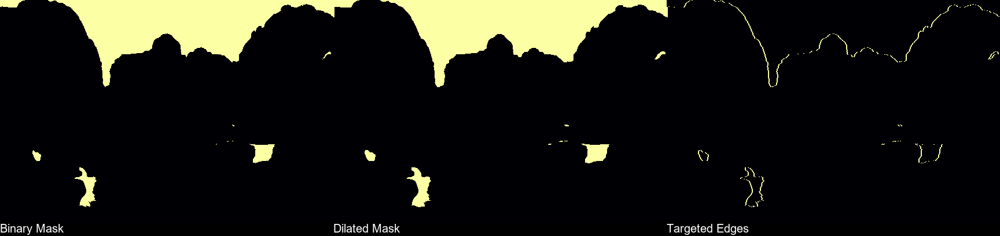

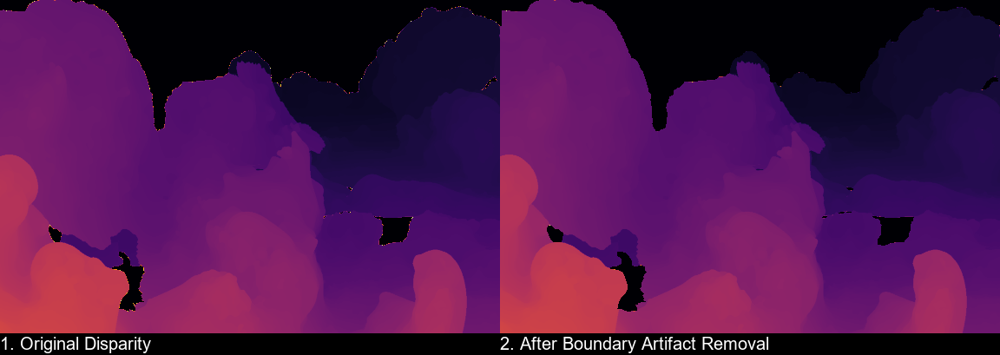

In [28]:
clean_disparity3, disparity_map = process_disparity_map(disparity.copy(), dilation_iterations=2, kernel_size=3)
clean_disparity3 = ((clean_disparity3 - np.min(clean_disparity3)) / (np.max(clean_disparity3) - np.min(clean_disparity3))) * 20
# Display the cleaned disparity, clean_disparity2 map and the original disparity map
display(pude_utils.make_image_grid_title([pude_utils.get_depth_as_image(disparity),
                                          pude_utils.get_depth_as_image(clean_disparity3)],
                                          ['1. Original Disparity', '2. After Boundary Artifact Removal'], rows=1, cols=2, font_size=20))